# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import dask.dataframe as dd
import plotly.express as px
import plotly.graph_objects as go
from memory_profiler import memory_usage


# Data Preprocessing

## Load the dataset

In [2]:
terror=pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')

C:\Users\Ahmed\AppData\Local\Temp\ipykernel_44828\1407956590.py:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  terror=pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')


In [3]:
terror.columns.values

array(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region', 'region_txt',
       'provstate', 'city', 'latitude', 'longitude', 'specificity',
       'vicinity', 'location', 'summary', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'alternative', 'alternative_txt', 'multiple',
       'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'targtype2',
       'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2',
       'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt',
       'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3',
       'natlty3_txt', 'gname', 'gsubname', 'gname2', 'gsubname2',
       'gname3', 'gsubname3', 'motive', 'guncertain1', 'guncertain2',
       'guncertain3', 'in

In [4]:
terror.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [5]:
terror.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


## Rename columns and select relevant ones

In [6]:
#select columns related to the analysis
terror.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
terror=terror[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]
terror['casualities']=terror['Killed']+terror['Wounded']

In [7]:
terror.head()

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,NaN
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,NaN


In [8]:
terror.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Month        181691 non-null  int64  
 2   Day          181691 non-null  int64  
 3   Country      181691 non-null  object 
 4   Region       181691 non-null  object 
 5   city         181256 non-null  object 
 6   latitude     177135 non-null  float64
 7   longitude    177134 non-null  float64
 8   AttackType   181691 non-null  object 
 9   Killed       171378 non-null  float64
 10  Wounded      165380 non-null  float64
 11  Target       181053 non-null  object 
 12  Summary      115562 non-null  object 
 13  Group        181691 non-null  object 
 14  Target_type  181691 non-null  object 
 15  Weapon_type  181691 non-null  object 
 16  Motive       50561 non-null   object 
 17  casualities  164817 non-null  float64
dtypes: float64(5), int64(3),

In [9]:
terror.describe()

,Year,Month,Day,latitude,longitude,Killed,Wounded,casualities
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,171378.000000,165380.000000,164817.000000
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02,2.403272,3.167668,5.296128
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05,11.545741,35.949392,42.069023
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000,0.000000
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000,0.000000
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000,1.000000
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000,4.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000,9574.000000


In [10]:
terror['Month'].value_counts()

Month
5     16875
7     16268
8     15800
10    15563
6     15359
3     15257
4     15152
1     14936
11    14906
9     14180
2     13879
12    13496
0        20
Name: count, dtype: int64

In [11]:
terror['Day'].value_counts()

Day
15    6500
1     6344
4     6153
16    6112
10    6064
9     6057
13    6043
14    6028
28    6027
12    6012
3     6011
7     5997
19    5973
2     5954
27    5937
11    5936
20    5930
18    5880
25    5875
8     5859
17    5852
5     5844
21    5827
26    5823
22    5799
23    5782
6     5781
24    5752
29    5507
30    5046
31    3095
0      891
Name: count, dtype: int64

In [12]:
terror['Year'].value_counts()

Year
2014    16903
2015    14965
2016    13587
2013    12036
2017    10900
2012     8522
2011     5076
1992     5071
2010     4826
2008     4805
2009     4721
1991     4683
1989     4324
1990     3887
1988     3721
1984     3495
1994     3456
2007     3242
1997     3197
1987     3183
1995     3081
1996     3058
1985     2915
1983     2870
1986     2860
2006     2758
1979     2662
1980     2662
1981     2586
1982     2544
2005     2017
2001     1906
2000     1814
1978     1526
1999     1395
2002     1333
1977     1319
2003     1278
2004     1166
1998      934
1976      923
1975      740
1970      651
1974      581
1972      568
1973      473
1971      471
Name: count, dtype: int64

In [13]:
# drop 0 values in month column
terror=terror[terror['Month']!=0]
terror=terror[terror['Day']!=0]

## Handle missing values

In [14]:
# Check for missing values
missing_values = terror.isnull().sum()
print(missing_values)

Year                0
Month               0
Day                 0
Country             0
Region              0
city              432
latitude         4469
longitude        4470
AttackType          0
Killed          10151
Wounded         16128
Target            633
Summary         65528
Group               0
Target_type         0
Weapon_type         0
Motive         130527
casualities     16683
dtype: int64


In [15]:
# check for missing values in percentage
missing_percentage = (terror.isnull().sum()/terror.shape[0])*100
print(missing_percentage)

Year            0.000000
Month           0.000000
Day             0.000000
Country         0.000000
Region          0.000000
city            0.238938
latitude        2.471792
longitude       2.472345
AttackType      0.000000
Killed          5.614491
Wounded         8.920354
Target          0.350111
Summary        36.243363
Group           0.000000
Target_type     0.000000
Weapon_type     0.000000
Motive         72.194137
casualities     9.227323
dtype: float64


In [16]:
# drop motive and summary columns
terror.drop(['Motive'],axis=1,inplace=True)
terror.drop(['Summary'],axis=1,inplace=True)

# drop rows with missing values
terror.dropna(axis=0,inplace=True)

In [17]:
# check for missing values
missing_values = terror.isnull().sum()
print(missing_values)

Year           0
Month          0
Day            0
Country        0
Region         0
city           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Target         0
Group          0
Target_type    0
Weapon_type    0
casualities    0
dtype: int64


In [18]:
# check for duplicate rows
duplicate_rows = terror.duplicated().sum()
print(duplicate_rows)

8897


In [19]:
# duplicate percentage
duplicate_percentage = (terror.duplicated().sum()/terror.shape[0])*100
print(duplicate_percentage)

5.584428627022684


In [20]:
# drop duplicate rows
terror.drop_duplicates(inplace=True)

In [21]:
# number of records after cleaning
terror.shape

(150421, 16)

In [22]:
# loss of data
loss_of_data = 100 - (terror.shape[0]/181691)*100
print(loss_of_data)

17.210538771870915


In [23]:
terror.head()

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,Target_type,Weapon_type,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown,1.0
5,1970,1,1,United States,North America,Cairo,37.005105,-89.176269,Armed Assault,0.0,0.0,Cairo Police Headquarters,Black Nationalists,Police,Firearms,0.0
6,1970,1,2,Uruguay,South America,Montevideo,-34.891151,-56.187214,Assassination,0.0,0.0,Juan Maria de Lucah/Chief of Directorate of in...,Tupamaros (Uruguay),Police,Firearms,0.0
7,1970,1,2,United States,North America,Oakland,37.791927,-122.225906,Bombing/Explosion,0.0,0.0,Edes Substation,Unknown,Utilities,Explosives,0.0
8,1970,1,2,United States,North America,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,0.0,0.0,"R.O.T.C. offices at University of Wisconsin, M...",New Year's Gang,Military,Incendiary,0.0


# Data Analysis

In [24]:
mean_killed = np.mean(terror['Killed'])
median_killed = np.median(terror['Killed'])
std_killed = np.std(terror['Killed'])

mean_wounded = np.mean(terror['Wounded'])
median_wounded = np.median(terror['Wounded'])
std_wounded = np.std(terror['Wounded'])

In [25]:
print(f"Mean killed: {mean_killed}, Median killed: {median_killed}, Std killed: {std_killed}")
print(f"Mean wounded: {mean_wounded}, Median wounded: {median_wounded}, Std wounded: {std_wounded}")

Mean killed: 2.1933174224343674, Median killed: 0.0, Std killed: 10.032976760174048
Mean wounded: 3.3577293064133333, Median wounded: 0.0, Std wounded: 37.628016496197134


In [26]:
# Most frequent values in categorical columns
most_frequent_country = terror['Country'].mode()[0]
most_frequent_region = terror['Region'].mode()[0]
most_frequent_attacktype = terror['AttackType'].mode()[0]
most_frequent_targettype = terror['Target_type'].mode()[0]
most_frequent_weapontype = terror['Weapon_type'].mode()[0]

print(f"Most frequent country: {most_frequent_country}")
print(f"Most frequent region: {most_frequent_region}")
print(f"Most frequent attack type: {most_frequent_attacktype}")
print(f"Most frequent target type: {most_frequent_targettype}")
print(f"Most frequent weapon type: {most_frequent_weapontype}")

Most frequent country: Iraq
Most frequent region: Middle East & North Africa
Most frequent attack type: Bombing/Explosion
Most frequent target type: Private Citizens & Property
Most frequent weapon type: Explosives


In [27]:
# Group by year and calculate number of attacks
attacks_per_year = terror.groupby('Year').size()

# Group by country and calculate number of attacks
attacks_per_country = terror.groupby('Country').size()

# Group by region and calculate number of attacks
attacks_per_region = terror.groupby('Region').size()

<Axes: title={'center': 'Number of Terrorist Attacks Per Year'}, xlabel='Year'>

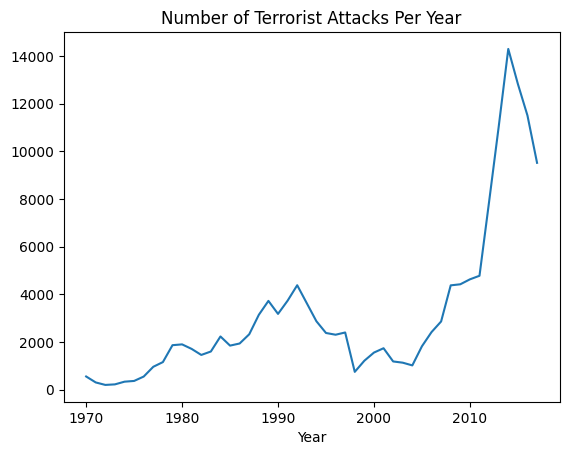

In [28]:
# Identify trends over time (number of attacks per year)
attacks_per_year.plot(kind='line', title='Number of Terrorist Attacks Per Year')

In [29]:
# Most affected regions
most_affected_regions = attacks_per_region.sort_values(ascending=False).head(10)
print(most_affected_regions)

Region
Middle East & North Africa     43543
South Asia                     40685
South America                  14176
Sub-Saharan Africa             13302
Western Europe                 12382
Southeast Asia                 10813
Central America & Caribbean     6259
Eastern Europe                  4676
North America                   3143
East Asia                        657
dtype: int64


In [30]:
# Most affected countries
most_affected_countries = attacks_per_country.sort_values(ascending=False).head(10)
print(most_affected_countries)

Country
Iraq              21675
Pakistan          13141
Afghanistan       11484
India             10887
Colombia           6520
Philippines        6076
Peru               4192
Turkey             3750
Thailand           3384
United Kingdom     3243
dtype: int64


In [31]:
# Top 5 terrorism groups
most_terrorism_groups = terror['Group'].value_counts()
print(most_terrorism_groups[0:5])

Group
Unknown                                        73166
Taliban                                         6616
Islamic State of Iraq and the Levant (ISIL)     4256
Shining Path (SL)                               3084
Al-Shabaab                                      2333
Name: count, dtype: int64


# Visualization

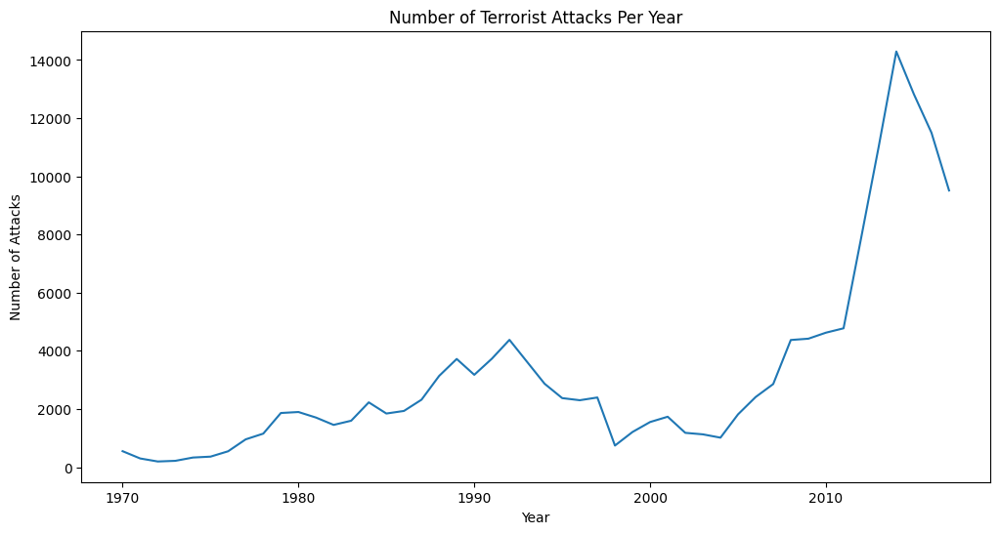

In [32]:
# Line plot for trend over the years
plt.figure(figsize=(12,6))
sns.lineplot(data=attacks_per_year)
plt.title('Number of Terrorist Attacks Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.show()

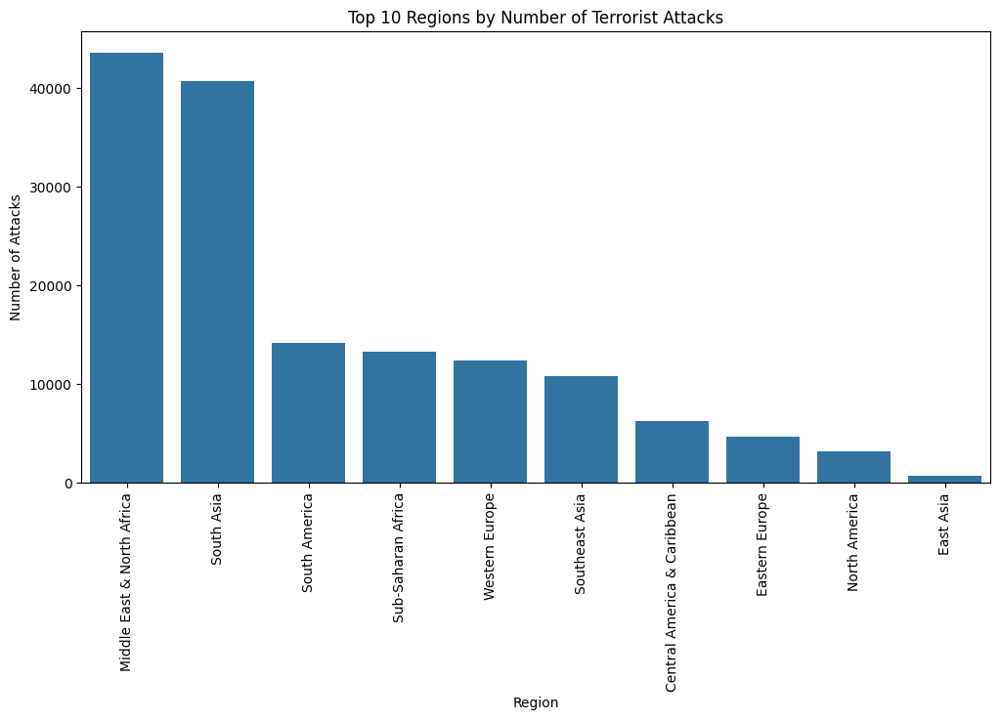

In [33]:
# Bar plot for attacks by region
plt.figure(figsize=(12,6))
sns.barplot(x=most_affected_regions.index, y=most_affected_regions.values)
plt.title('Top 10 Regions by Number of Terrorist Attacks')
plt.xlabel('Region')
plt.ylabel('Number of Attacks')
plt.xticks(rotation=90)
plt.show()

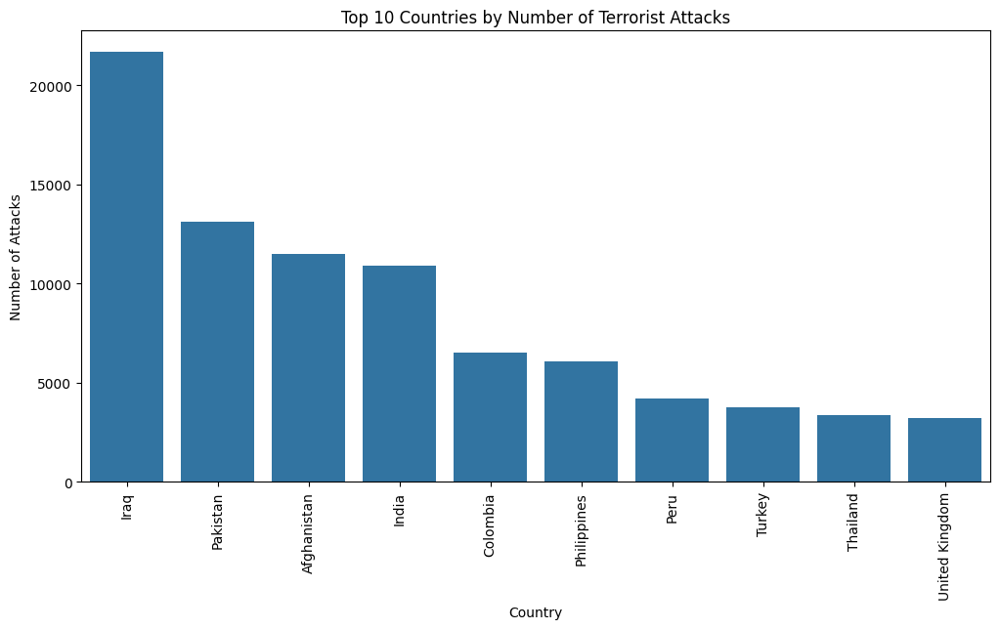

In [34]:
# Bar plot for attacks by country
plt.figure(figsize=(12,6))
sns.barplot(x=most_affected_countries.index, y=most_affected_countries.values)
plt.title('Top 10 Countries by Number of Terrorist Attacks')
plt.xlabel('Country')
plt.ylabel('Number of Attacks')
plt.xticks(rotation=90)
plt.show()

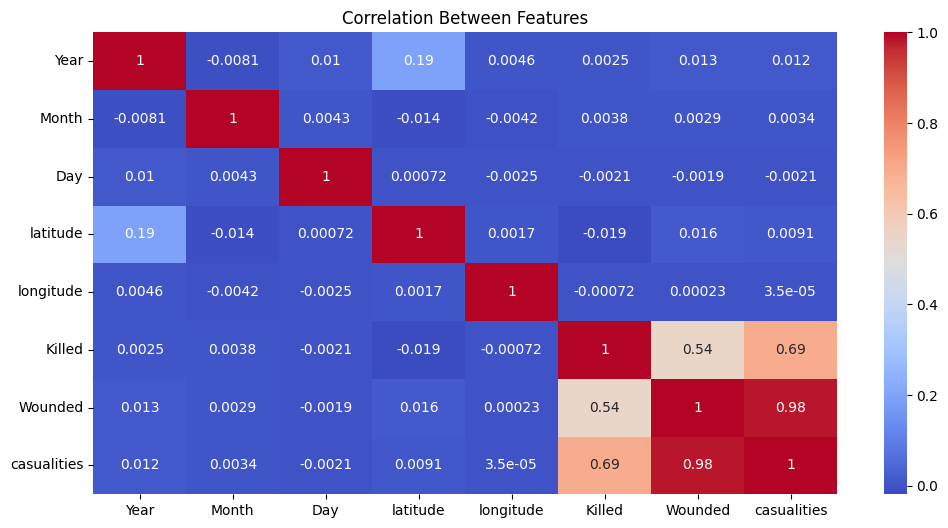

In [35]:
numeric_columns = terror.select_dtypes(include=[np.number])

correlation_matrix = numeric_columns.corr()

plt.figure(figsize=(12,6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Between Features')
plt.show()

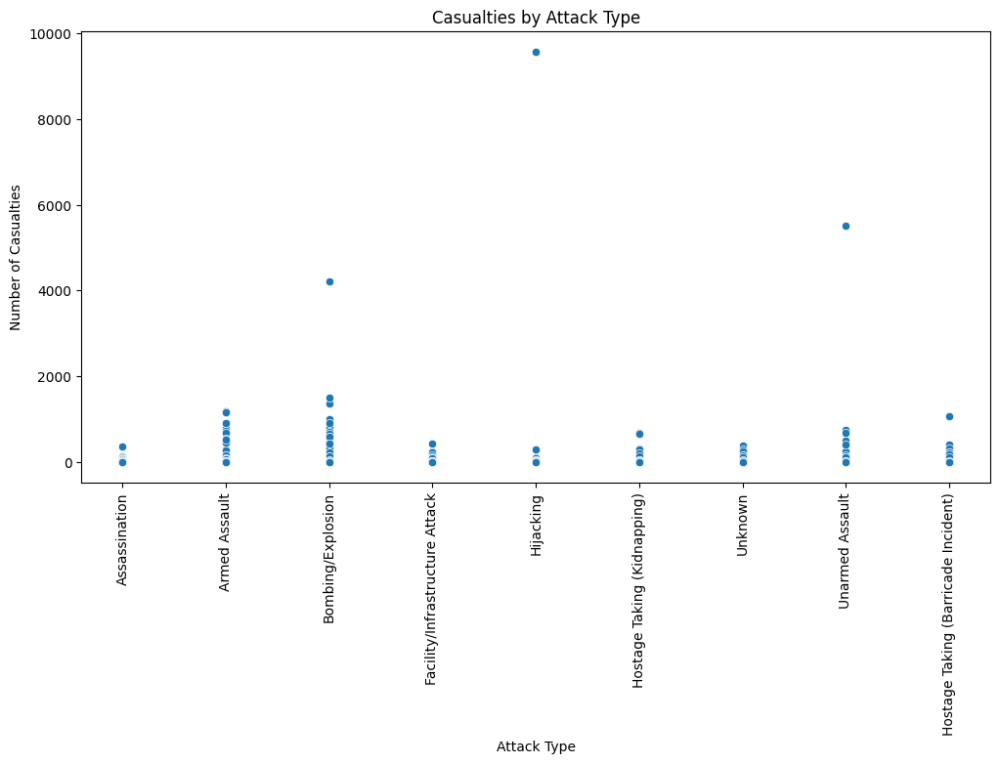

In [36]:
# Scatter plot for relationship between casualties and attack type
plt.figure(figsize=(12,6))
sns.scatterplot(data=terror, x='AttackType', y='casualities')
plt.title('Casualties by Attack Type')
plt.xlabel('Attack Type')
plt.ylabel('Number of Casualties')
plt.xticks(rotation=90)
plt.show()

In [37]:
# Aggregate the number of attacks by country
country_attacks = terror.groupby('Country').size().reset_index(name='Number_of_Attacks')

fig = px.choropleth(country_attacks,
                    locations='Country',
                    locationmode='country names',
                    color='Number_of_Attacks',
                    hover_name='Country',
                    color_continuous_scale='thermal',
                    title='Geographic Distribution of Terrorist Attacks')

fig.show()

In [38]:
# # Aggregate the data by location (latitude and longitude)
# terror_aggregated = terror.groupby(['latitude', 'longitude', 'Group']).size().reset_index(name='count')

# fig = px.scatter_geo(terror_aggregated,
#                      lat='latitude',
#                      lon='longitude',
#                      size='count',
#                      hover_name='Group',
#                      color='Group',
#                      size_max=20,   
#                      title='Geographic Distribution of Terrorist Attacks')

# fig.show()

In [56]:
# Create the interactive map with animation
terror['scaled_casualities'] = terror['casualities'] + 400 #because alot of the casualities are 0
fig = px.scatter_geo(terror,
                     lat='latitude',
                     lon='longitude',
                     hover_name='city',
                     animation_frame='Year',
                     size='scaled_casualities',  
                     title='Spread of Terrorism Over the Years',
) 

fig.show()

In [40]:
# terror.to_csv('terror_database_clean.csv', index=False) 

In [41]:
# import PIL
# import io
# # generate images for each step in animation
# frames = []
# for s, fr in enumerate(fig.frames):
#     # set main traces to appropriate traces within plotly frame
#     fig.update(data=fr.data)
#     # move slider to correct place
#     fig.layout.sliders[0].update(active=s)
#     # generate image of current state
#     frames.append(PIL.Image.open(io.BytesIO(fig.to_image(format="png"))))

# # append duplicated last image more times, to keep animation stop at last status
# for i in range(5):
#     frames.append(frames[-1])

# # create animated GIF
# frames[0].save(
#         "test.gif",
#         save_all=True,
#         append_images=frames[1:],
#         optimize=False,
#         duration=500,
#         loop=0
# )

# Performance comparison with dask

In [55]:
dask_terror = dd.read_csv('terror_database_clean.csv', encoding='ISO-8859-1')
dask_terror = dask_terror.persist()  

def pandas_groupby():
    terror = pd.read_csv('terror_database_clean.csv', encoding='ISO-8859-1')
    return terror.groupby('Year').size()

def dask_groupby():
    result = dask_terror.groupby('Year').size().compute()
    return result

start_time = time.time()
pandas_groupby()
pandas_duration = time.time() - start_time
pandas_memory = memory_usage((pandas_groupby, ), interval=0.1, timeout=120)

start_time = time.time()
dask_groupby()
dask_duration = time.time() - start_time
dask_memory = memory_usage((dask_groupby, ), interval=0.1, timeout=120)

print(f"Pandas duration: {pandas_duration} seconds")
print(f"Dask duration: {dask_duration} seconds")
print(f"Peak memory usage for Pandas: {max(pandas_memory)} MiB")
print(f"Peak memory usage for Dask: {max(dask_memory)} MiB")

Pandas duration: 0.4500010013580322 seconds
Dask duration: 0.021999597549438477 seconds
Peak memory usage for Pandas: 823.71875 MiB
Peak memory usage for Dask: 774.50390625 MiB
